In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from sklearn.model_selection import train_test_split as ttsplit
from sklearn.preprocessing import StandardScaler as ss
from sklearn.model_selection import cross_validate as cv
from sklearn.linear_model import Lasso, Ridge
from sklearn.metrics import mean_absolute_error as mae
from sklearn.metrics import mean_absolute_percentage_error as mape

In [2]:
data = pd.read_csv('database.csv')

In [3]:
data

,charges,age,sex,bmi,children,smoker,region
0,16884.92400,19,0,27.900,0,1,1
1,1725.55230,18,1,33.770,1,0,2
2,4449.46200,28,1,33.000,3,0,2
3,21984.47061,33,1,22.705,0,0,3
4,3866.85520,32,1,28.880,0,0,3
...,...,...,...,...,...,...,...
1333,10600.54830,50,1,30.970,3,0,3
1334,2205.98080,18,0,31.920,0,0,4
1335,1629.83350,18,0,36.850,0,0,2
1336,2007.94500,21,0,25.800,0,0,1


**LEARNING DATABASE**

# **AGE**

**CORRELATION**

In [4]:
data['charges'].corr(data['age'])

0.29900819333064765

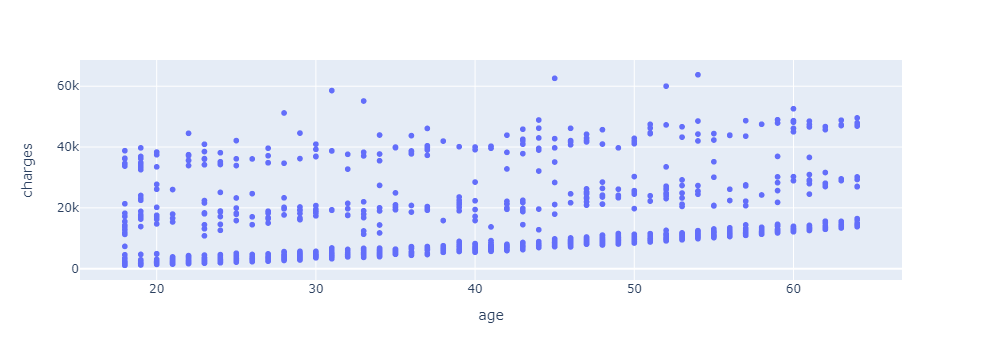

In [5]:
fig = px.scatter(data, x='age', y='charges')
fig.show()

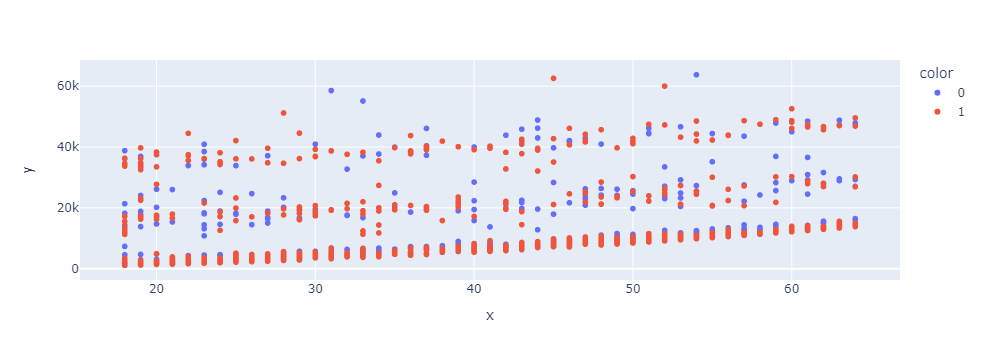

In [6]:
fig = px.scatter(x=data['age'], y=data['charges'], color=data['sex'].astype(str))
fig.show()

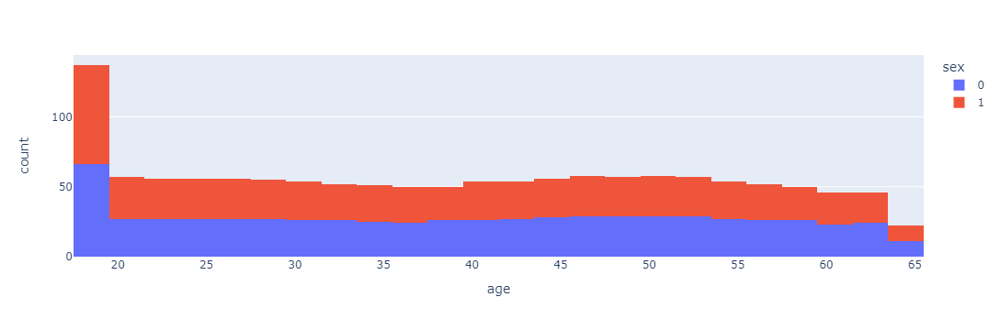

In [7]:
fig = px.histogram(data, x="age", color="sex")
fig.show()

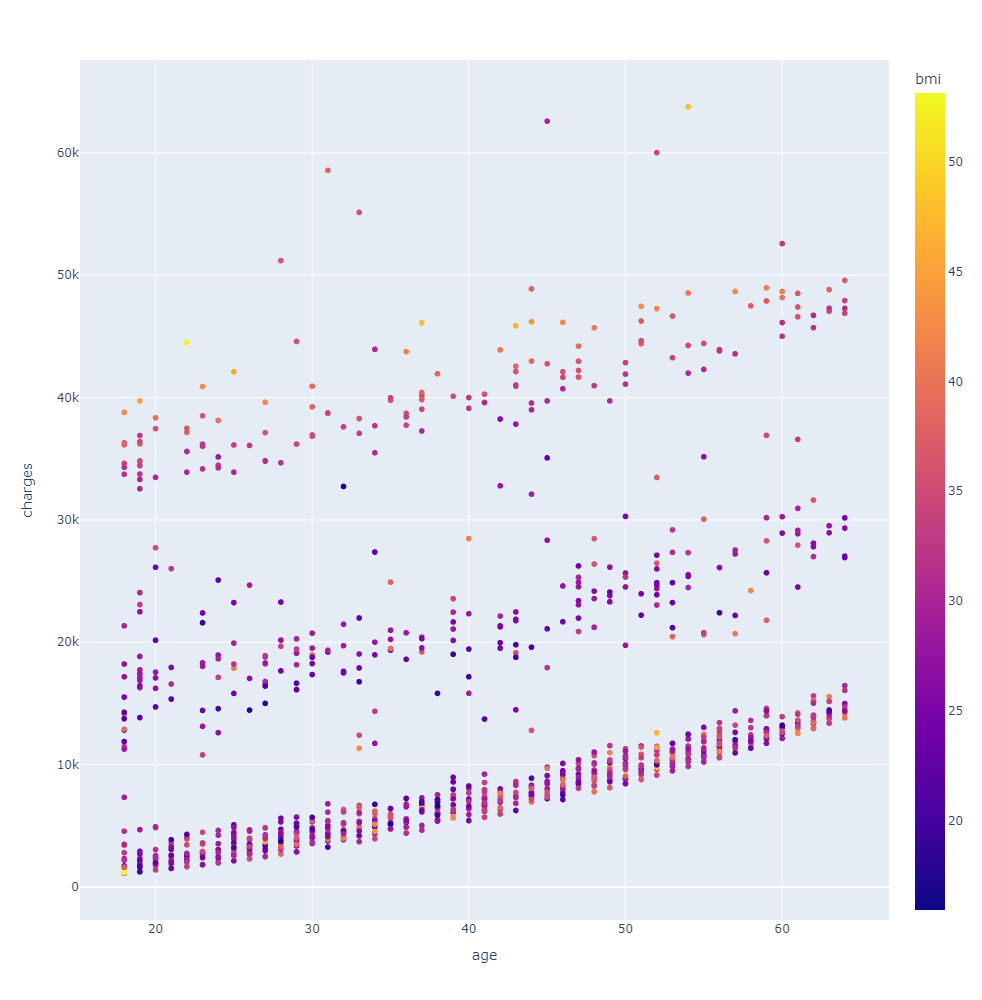

In [8]:
fig = px.scatter(data, x='age', y='charges', color='bmi', height=1000)
fig.show()

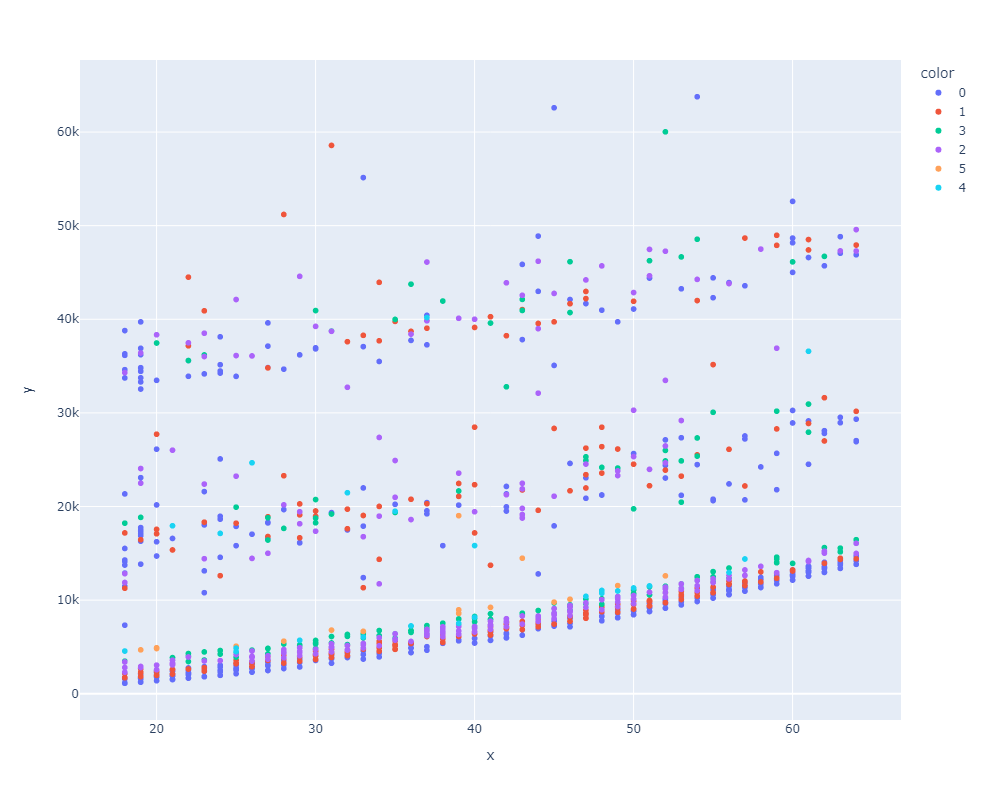

In [9]:
fig = px.scatter(x=data['age'], y=data['charges'], color=data['children'].astype(str), height=800)
fig.show()

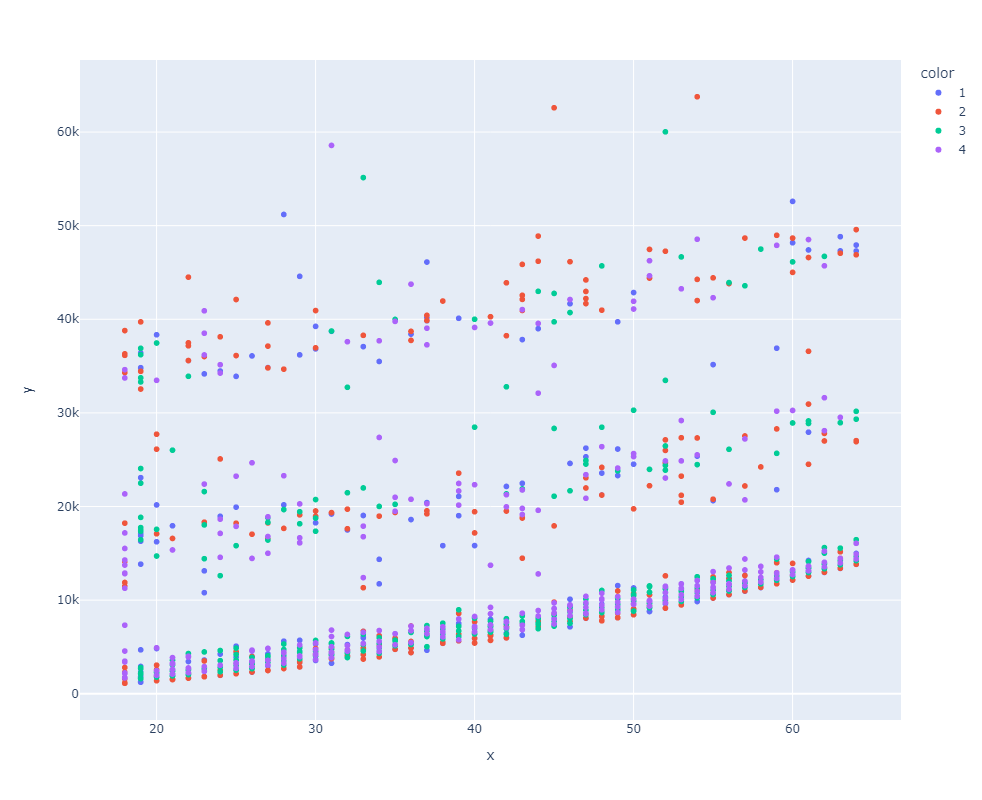

In [10]:
fig = px.scatter(x=data['age'], y=data['charges'], color=data['region'].astype(str), height=800)
fig.show()

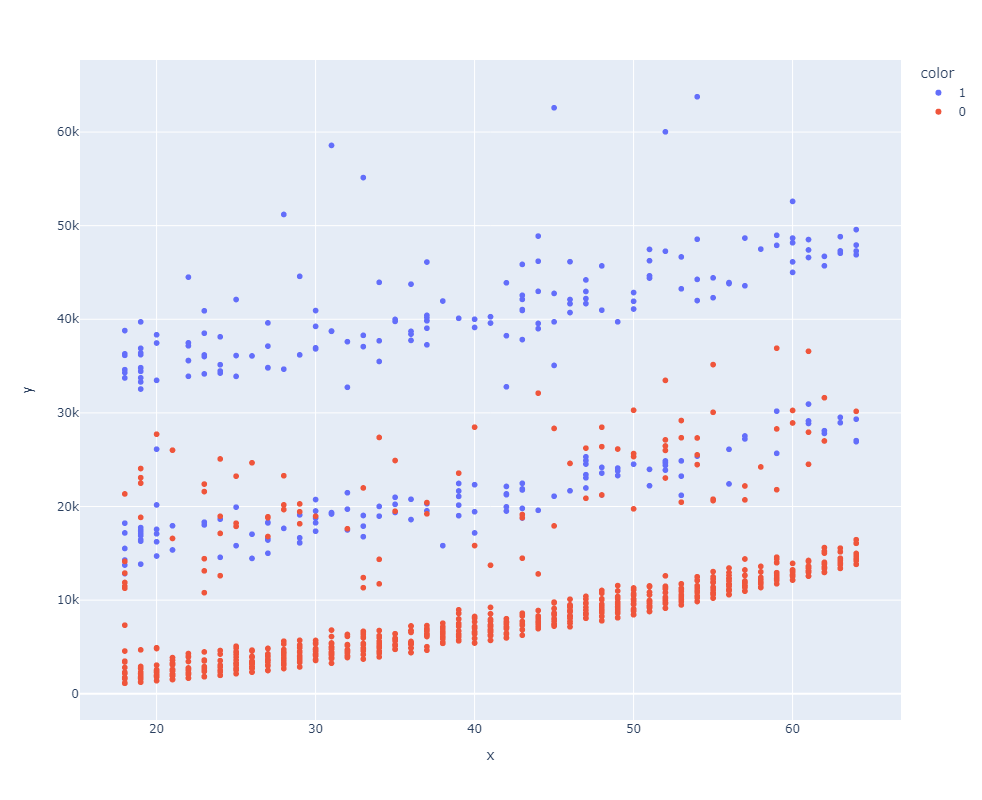

In [11]:
fig = px.scatter(x=data['age'], y=data['charges'], color=data['smoker'].astype(str), height=800)
fig.show()

# **BMI**

In [12]:
data['charges'].corr(data['bmi'])

0.19834096883362892

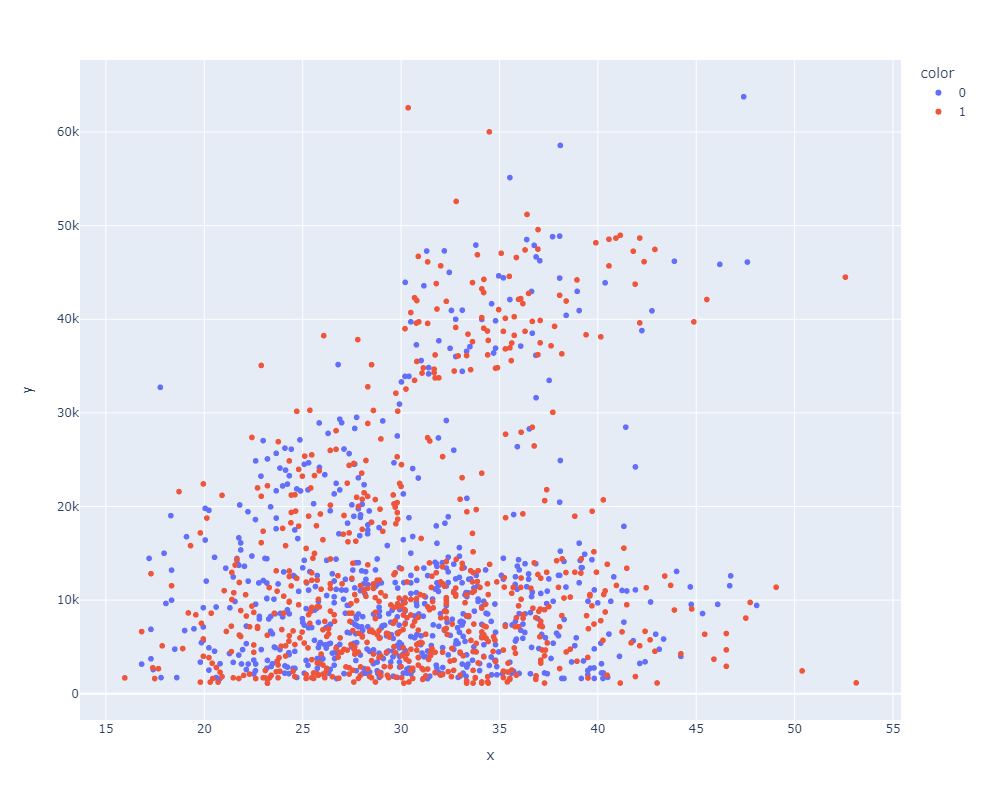

In [13]:
fig = px.scatter(x=data['bmi'], y=data['charges'], color=data['sex'].astype(str), height=800)
fig.show()

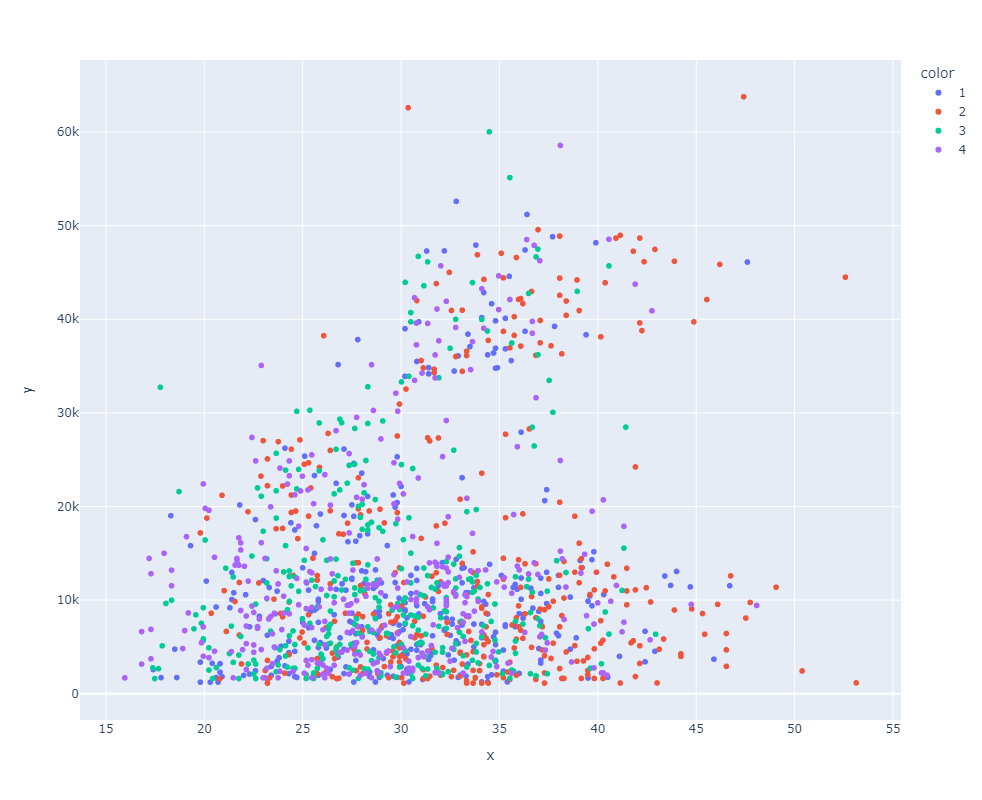

In [14]:
fig = px.scatter(x=data['bmi'], y=data['charges'], color=data['region'].astype(str), height=800)
fig.show()

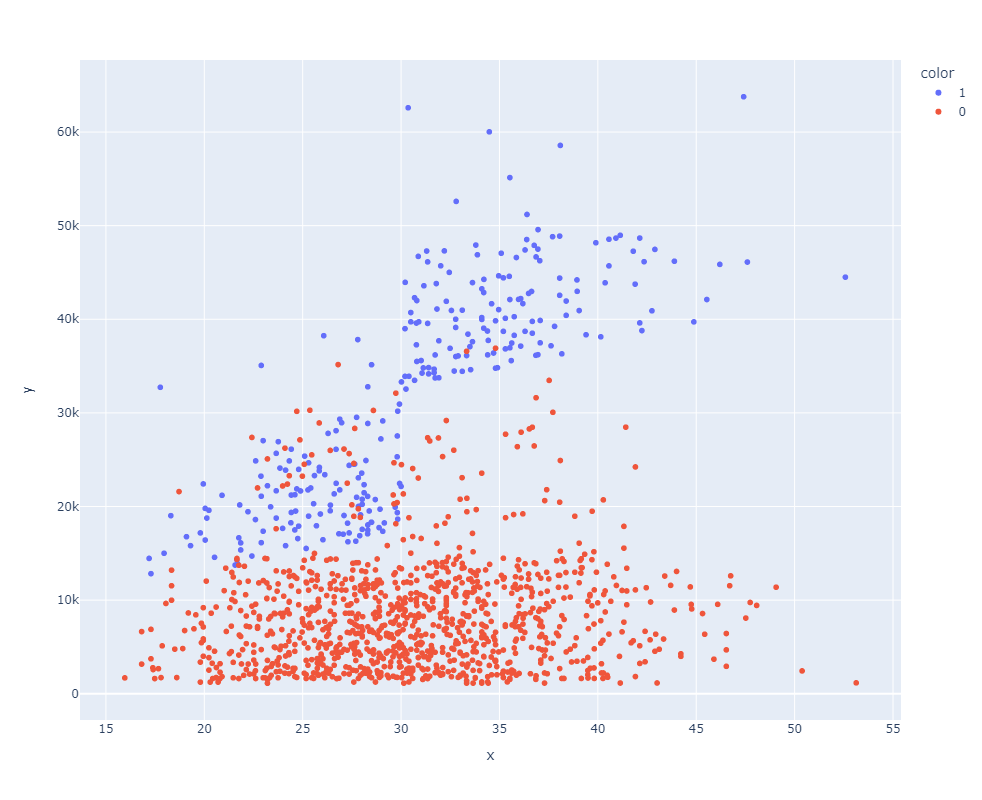

In [15]:
fig = px.scatter(x=data['bmi'], y=data['charges'], color=data['smoker'].astype(str), height=800)
fig.show()

# **REGION**

In [16]:
data['charges'].corr(data['region'])

0.006208234909444507

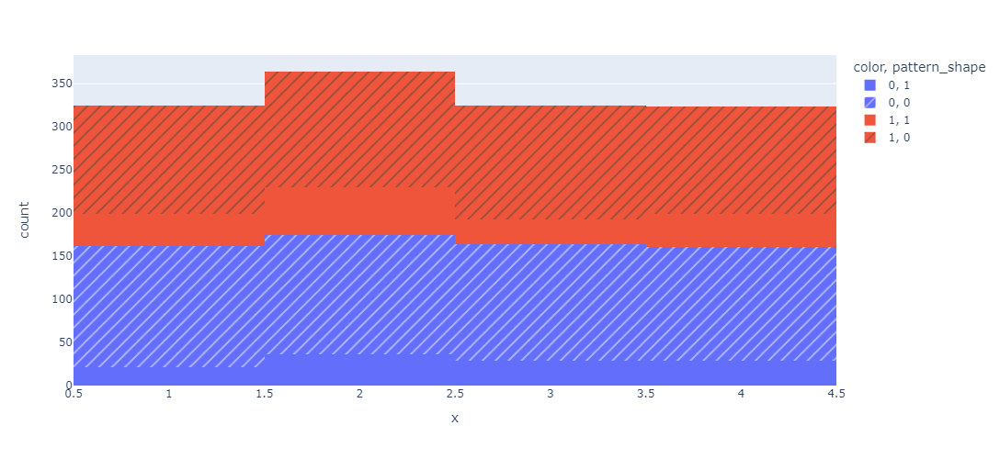

In [17]:
fig = px.histogram(x=data['region'], color=data['sex'].astype(str), pattern_shape=data["smoker"], height=500, nbins=4)
fig.show()

# **FITTING**

**SPLIT DATASET INTO TEST AND TRAIN**

In [18]:
X_train, X_test, y_train, y_test = ttsplit(
    data.loc[:, ~data.columns.isin(['charges'])], data['charges'], 
    test_size=0.2, 
    random_state=42
)

**SCALING**

In [19]:
scale = ss()
X_train_sc = scale.fit_transform(X_train)
X_test_sc = scale.transform(X_test)
y_train_sc = scale.fit_transform(y_train.to_numpy().reshape(-1, 1))
y_test_sc = scale.transform(y_test.to_numpy().reshape(-1, 1))

**HYPERPARAMETERS OPTIMISATION**

In [20]:
alp = np.linspace(1e-5, 200, 10000)

In [21]:
def alph_opt(alpha, linear_model):
    regr = linear_model(alpha=alpha)
    cv_results = cv(regr, X_train_sc, y_train_sc, cv=5, scoring='neg_mean_absolute_error')
    return np.min(np.abs(cv_results['test_score'])), np.max(np.abs(cv_results['test_score']))

**USE LASSO**

In [22]:
vec_alp_opt = np.vectorize(alph_opt)
cv_min, cv_max = vec_alp_opt(alp, Lasso)

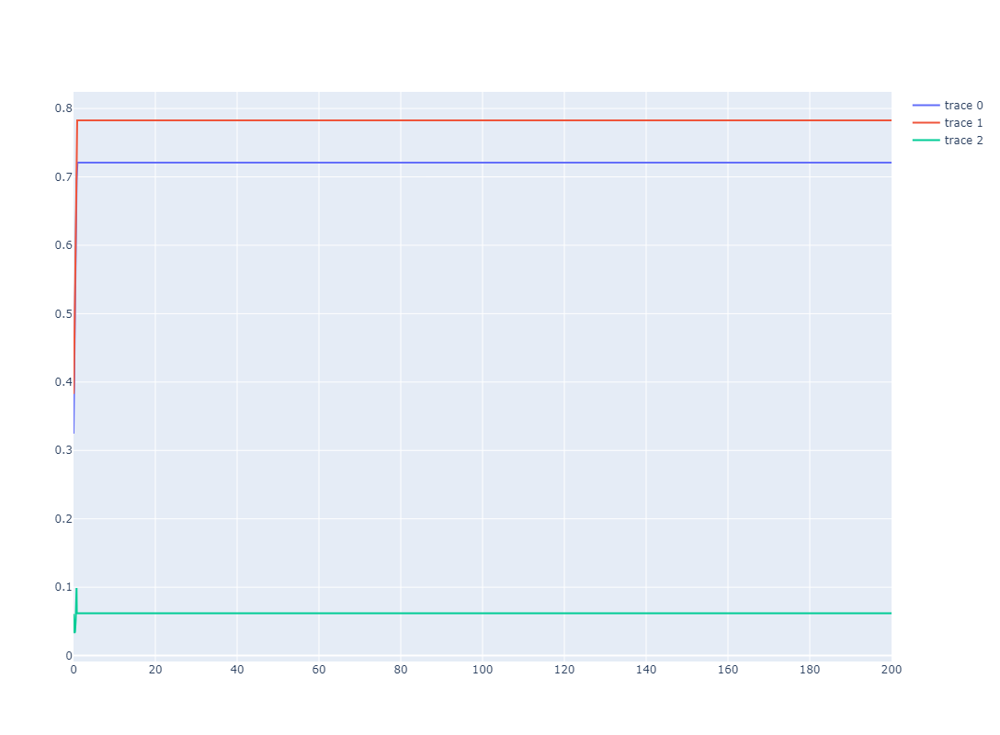

In [23]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=alp, y=cv_min))
fig.add_trace(go.Scatter(x=alp, y=cv_max))
fig.add_trace(go.Scatter(x=alp, y=cv_max - cv_min))
fig.update_layout(height=800)
fig.show()

**USE RIDGE**

In [24]:
cv_min_ri, cv_max_ri = vec_alp_opt(alp, Ridge)

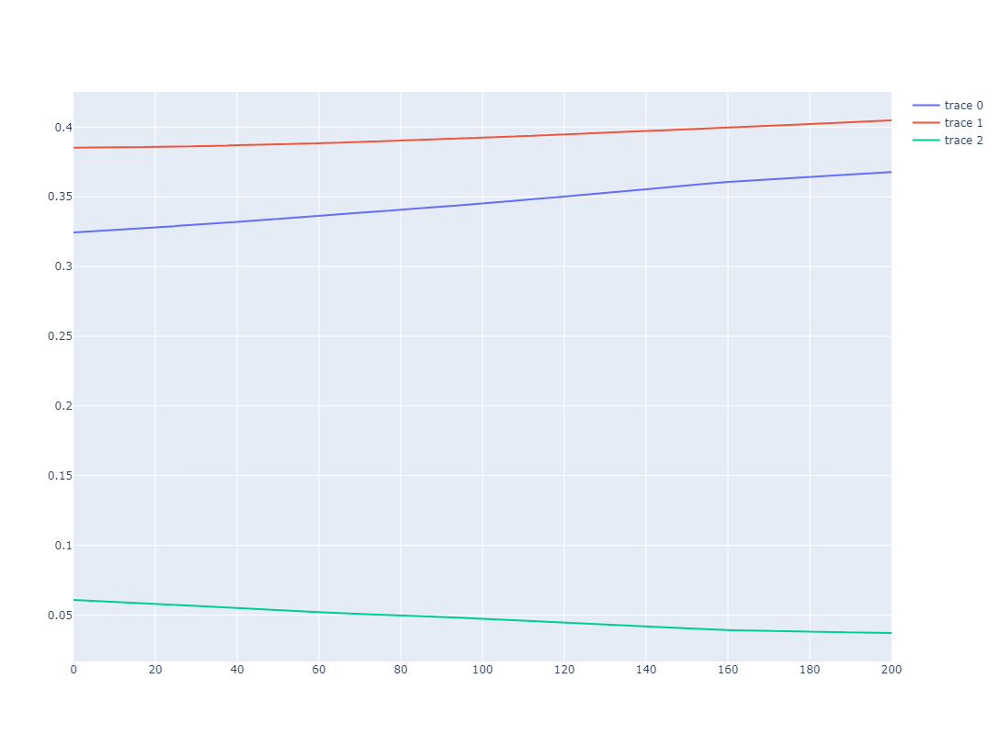

In [25]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=alp, y=cv_min_ri))
fig.add_trace(go.Scatter(x=alp, y=cv_max_ri))
fig.add_trace(go.Scatter(x=alp, y=cv_max_ri - cv_min_ri))
fig.update_layout(height=800)
fig.show()

**DECIDE TO USE LASSO WITH ALPHA 0.23024**

**LETS CALCULATE DIFFERENT METRICS FOR THIS MODEL**

In [26]:
lasso = Lasso(alpha=0.23024)
lasso.fit(X_train_sc, y_train_sc)
y_train_predict = lasso.predict(X_train_sc)
y_test_predict = lasso.predict(X_test_sc)

In [27]:
mae(y_train_sc, y_train_predict)

0.46793918225469777

In [28]:
mae(y_test_sc, y_test_predict)

0.4767194291404777

In [29]:
mape(y_train_sc, y_train_predict)

1.5152538318565216

In [30]:
mape(y_test_sc, y_test_predict)

0.9871584807566228

**SCALE PREDICTED TEST VALUES BACK**

In [34]:
y_test_predict_back_scaled = scale.inverse_transform(y_test_predict.reshape(-1, 1))

In [36]:
mae(y_test, y_test_predict_back_scaled)

5727.256151560879